# class6, resnet50, gen

In [1]:
%matplotlib inline

In [2]:
import random
import os
import copy
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
from PIL import Image
from confusion_matrix import aicots_confusion_matrix
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

In [3]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras import layers, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Dense, Flatten, Dropout, Activation, Conv2D, MaxPooling2D,GlobalAveragePooling2D,BatchNormalization

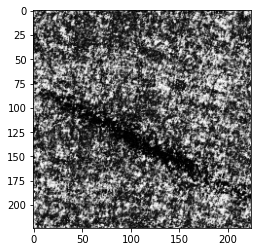

In [4]:
image = np.array(load_img("./Class6_resize-aug/Test/NG/0404.PNG", target_size=(224, 224, 3)))
plt.imshow(image)

In [5]:
input_size = (224,224)
batch_size = 8
epoch = 20
label = {'NG':0, 'PASS':1}
classes=['NG','PASS']
num_classes  = len(label)

In [6]:
def build_model():
    """build model function"""
    # Resnet
    input_tensor = Input(shape=(224, 224, 3)) #input shape
    resnet50 = ResNet50(
        include_top=False,                
        weights='imagenet',               # 使用在imagenet上訓練好的模型
        input_tensor=input_tensor,      
    )
    
    top_model = Sequential()
    top_model.add(GlobalAveragePooling2D())               
    top_model.add(Dense(num_classes, activation='softmax'))     #resnet50原本是預測1000類，改成我們的類別
    model = Model(resnet50.input, top_model(resnet50.output))
    
    # 凍結神經層
    for layer in model.layers[:-10]:
        layer.trainable = False or isinstance(layer, BatchNormalization) 

    # compile
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [7]:
model = build_model()
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_______________________________________________________________________________________

In [8]:
optimizer = Adam()
model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [9]:
input_path = './Class6_resize-aug/'
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_directory(
    input_path + 'Train',
    batch_size=batch_size,
    class_mode='binary',
    target_size=input_size)

validation_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input)

validation_generator = validation_datagen.flow_from_directory(
    input_path + 'Test',
    shuffle=False,
    class_mode='binary',
target_size=input_size)

Found 990 images belonging to 2 classes.
Found 575 images belonging to 2 classes.


In [10]:
train_datagen = ImageDataGenerator(
featurewise_center=False,  # set input mean to 0 over the dataset
samplewise_center=False,  # set each sample mean to 0
featurewise_std_normalization=False,  # divide inputs by std of the dataset
samplewise_std_normalization=False,  # divide each input by its std
# zca_whitening=False,  # apply ZCA whitening
# zca_epsilon=1e-06,  # epsilon for ZCA whitening
rotation_range=2,  # randomly rotate images in the range (degrees, 0 to 180)
# randomly shift images horizontally (fraction of total width)
width_shift_range=0.,
# randomly shift images vertically (fraction of total height)
height_shift_range=0.,
# shear_range=0.05,  # set range for random shear
# zoom_range=0.01,  # set range for random zoom
channel_shift_range=15.,  # set range for random channel shifts
# set mode for filling points outside the input boundaries
fill_mode='nearest',
cval=0.,  # value used for fill_mode = "constant"
    
        
horizontal_flip=True,  # randomly flip images
vertical_flip=True,  # randomly flip images
    

# set rescaling factor (applied before any other transformation)
rescale=None,
# set function that will be applied on each input
preprocessing_function=preprocess_input,
# image data format, either "channels_first" or "channels_last"
data_format=None,
# fraction of images reserved for validation (strictly between 0 and 1)
validation_split=0.0)

train_generator = train_datagen.flow_from_directory(
directory=input_path+'Train',
target_size=input_size,
color_mode='rgb',
classes=None,
class_mode='binary',
batch_size=batch_size,
shuffle=True,
seed=None,
save_to_dir=None,
save_prefix='',
save_format='png',
follow_links=False,
subset=None,
interpolation='nearest')

validation_datagen = ImageDataGenerator(
preprocessing_function=preprocess_input)

validation_generator = validation_datagen.flow_from_directory(
directory=input_path + 'Test',
shuffle=False,
color_mode='rgb',
class_mode='binary',
target_size=input_size)

Found 990 images belonging to 2 classes.
Found 575 images belonging to 2 classes.


In [11]:
train_generator.next()[1].shape

(8,)

In [12]:
validation_generator.next()[1].shape

(32,)

In [13]:
train_generator.next()[1]

array([1., 1., 0., 1., 1., 0., 1., 1.], dtype=float32)

In [14]:
train_generator.next()[0].shape

(8, 224, 224, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


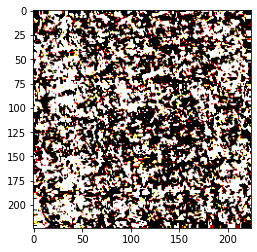

In [15]:
plt.imshow(train_generator.next()[0][0])

In [16]:
filepath='./model/class6_02_tf2_resnet50_Adam'
early_stopping = EarlyStopping(monitor='loss', patience=10)
loss_checkpoint = ModelCheckpoint(filepath + '_train_loss_best.hdf5', monitor='loss', verbose=1, save_best_only=True, mode='auto')
val_loss_checkpoint = ModelCheckpoint(filepath + '_val_acc_best.hdf5', monitor='val_accuracy', verbose=1, save_best_only=True, mode='auto')
val_acc_checkpoint = ModelCheckpoint(filepath + '_val_loss_best.hdf5', monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
callbacks_list = [early_stopping, loss_checkpoint, val_loss_checkpoint,val_acc_checkpoint]
history = model.fit_generator(generator=train_generator, epochs=epoch, validation_data=validation_generator, validation_steps=10, callbacks=callbacks_list)
    

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/20
124/124 [==============================] - ETA: 0s - loss: 0.3584 - accuracy: 0.8758
Epoch 00001: loss improved from inf to 0.35841, saving model to ./model/class6_02_tf2_resnet50_Adam_train_loss_best.hdf5

Epoch 00001: val_accuracy improved from -inf to 0.20938, saving model to ./model/class6_02_tf2_resnet50_Adam_val_acc_best.hdf5

Epoch 00001: val_loss improved from inf to 4.18242, saving model to ./model/class6_02_tf2_resnet50_Adam_val_loss_best.hdf5
124/124 [==============================] - 40s 323ms/step - loss: 0.3584 - accuracy: 0.8758 - val_loss: 4.1824 - val_accuracy: 0.2094
Epoch 2/20
124/124 [==============================] - ETA: 0s - loss: 0.0969 - accuracy: 0.9687
Epoch 00002: loss improved from 0.35841 to 0.09693, saving model to ./model/class6_02_tf2_resnet50_Adam_train_loss_best.hdf5

Epoch 00002: val_accuracy improved from 0.20938 to 0.21250, saving model to ./model/class6_02_tf2_r

In [17]:
# model = load_model('../../model/class6_04_tf2_resnet50_Adam_val_acc_best.hdf5')
model = load_model('./model/class6_02_tf2_resnet50_Adam_val_acc_best.hdf5')

In [18]:
count = 0
y_pred=[]
y_true=[]
for ind, val in enumerate(['NG','PASS']):
    print(val)
    for root, dirs, files in os.walk('./Class6_resize-aug/Test/'+val):
        for filename in tqdm(files):
            if filename.endswith('PNG'):
                cvimg = cv2.imread(os.path.join(root,filename))
                img = Image.open(os.path.join(root, filename))
                pred_probs = model.predict_on_batch(preprocess_input(np.array(img.resize((224,224))).reshape(1,224,224,3)))
                y_pred.append(np.argmax(pred_probs[0]))
                y_true.append(ind)
                count += 1


  0%|          | 0/67 [00:00<?, ?it/s]

NG


  1%|          | 4/508 [00:00<00:13, 37.28it/s]

PASS


100%|██████████| 508/508 [00:10<00:00, 46.49it/s]


In [19]:
label.keys()

dict_keys(['NG', 'PASS'])

/home/aiez5566/20200319/cash/confusion_matrix.py:181: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/home/aiez5566/20200319/cash/confusion_matrix.py:182: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  t.tick2On = False
/home/aiez5566/20200319/cash/confusion_matrix.py:184: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/home/aiez5566/20200319/cash/confusion_matrix.py:185: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  t.tick2On = False


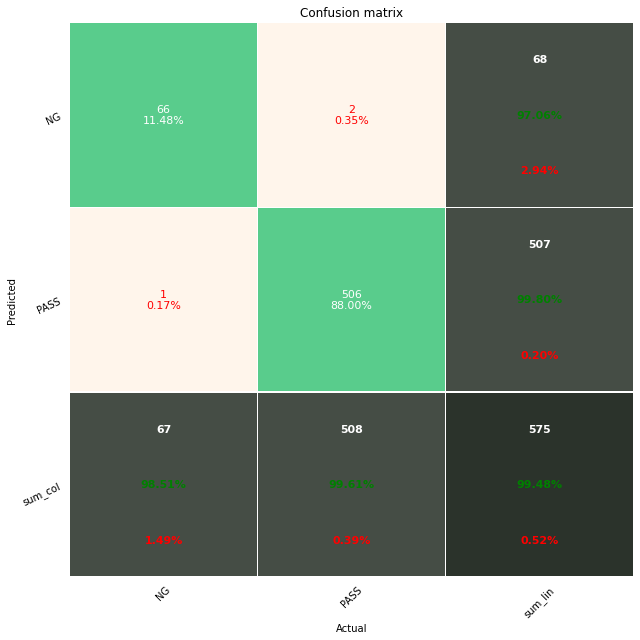

In [20]:
aicots_confusion_matrix(y_test=y_true, predictions=y_pred,
                        filepath='./'+'val_',label=label.keys())

In [21]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_______________________________________________________________________________________

In [22]:
last_conv_layer = model.get_layer("conv5_block3_out")
last_conv_layer_model = tf.keras.Model(model.inputs, last_conv_layer.output)

In [23]:
classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input
for layer_name in ["sequential"]:
    x = model.get_layer(layer_name)(x)
classifier_model = tf.keras.Model(classifier_input, x)

In [24]:
def grad_cam(classifier_model, image):
    with tf.GradientTape() as tape:
        inputs = image[np.newaxis, ...]
        last_conv_layer_output = last_conv_layer_model(inputs)    # 取影像輸入到model後，計算到最後一層的張量輸出
        tape.watch(last_conv_layer_output)    
        preds = classifier_model(last_conv_layer_output)
        top_pred_index = tf.argmax(preds[0])
        top_class_channel = preds[:, top_pred_index]

    grads = tape.gradient(top_class_channel, last_conv_layer_output)    

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

    # Average over all the filters to get a single 2D array
    gradcam = np.mean(last_conv_layer_output, axis=-1)
    # Clip the values (equivalent to applying ReLU)
    # and then normalise the values
    gradcam = np.clip(gradcam, 0, np.max(gradcam)) / np.max(gradcam)
    gradcam = cv2.resize(gradcam, (224, 224))
    
    return gradcam


In [25]:
def superimpose(image, cam):
    """superimpose original image and cam heatmap"""
    
    heatmap = cv2.resize(cam, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    superimposed_img = heatmap * .5 + image * .5
    superimposed_img = np.minimum(superimposed_img, 255.0).astype(np.uint8)  # scale 0 to 255  
    superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
    
    return image, heatmap, superimposed_img

In [26]:
def _plot(image, classifier_model):
    """plot original image, heatmap from cam and superimpose image"""

    img, heatmap, superimposed_img = superimpose(image, grad_cam(classifier_model, image))
    fig, axs = plt.subplots(ncols=3, figsize=(9, 4))

    axs[0].imshow(img)
    axs[0].set_title('original image')
    axs[0].axis('off')

    axs[1].imshow(heatmap)
    axs[1].set_title('heatmap')
    axs[1].axis('off')

    axs[2].imshow(superimposed_img)
    axs[2].set_title('superimposed image')
    axs[2].axis('off')

#     plt.suptitle('True label: ' + label[cls_true] + ' / Predicted label : ' + label[cls_pred])
    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


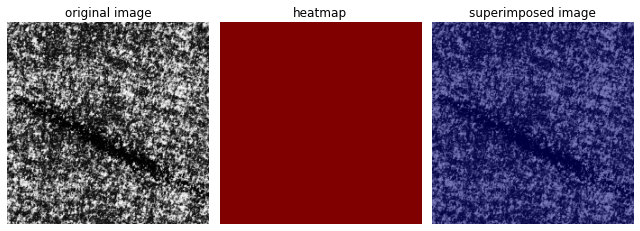

In [27]:
_plot(image, classifier_model)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


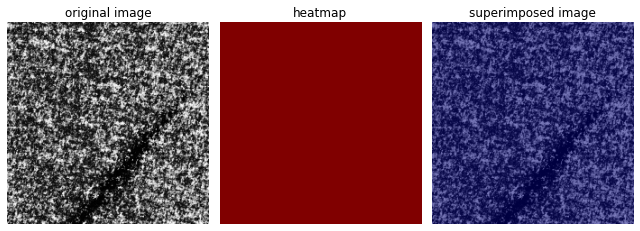

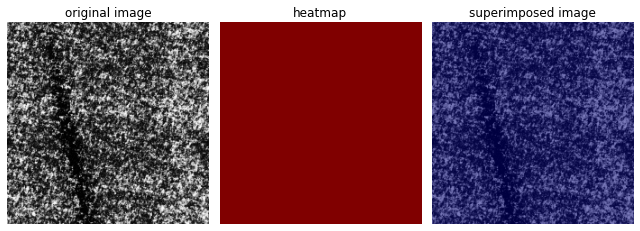

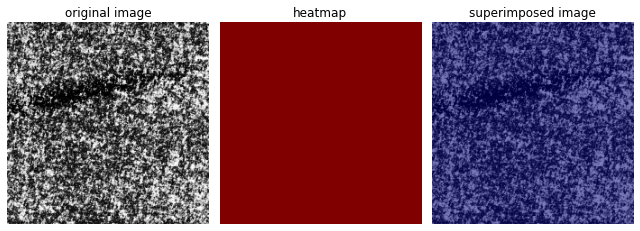

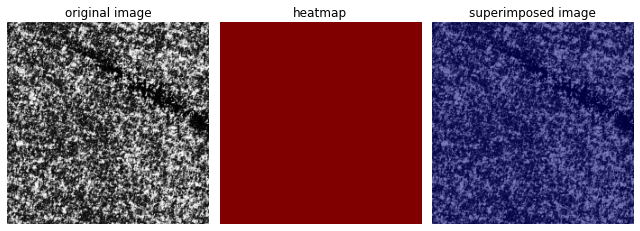

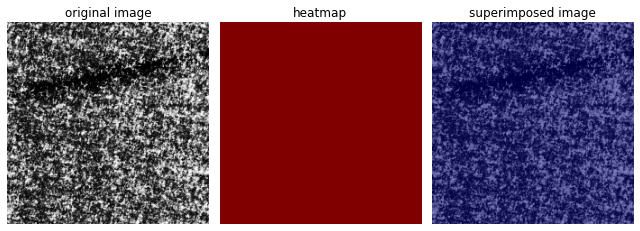

...

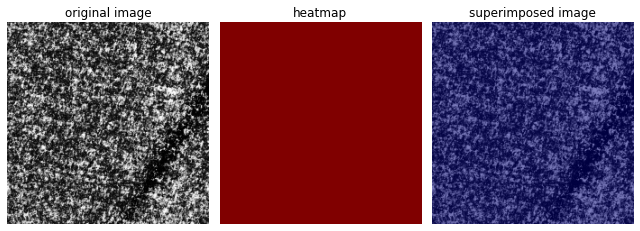

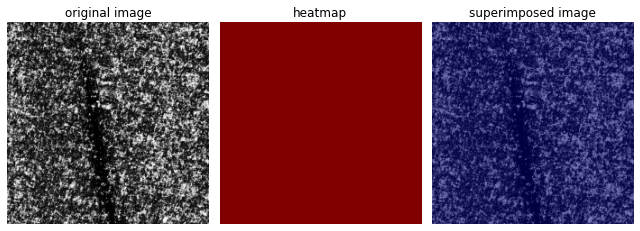

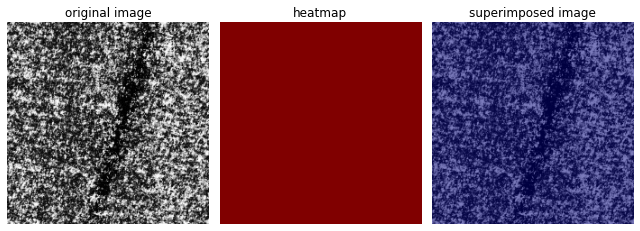

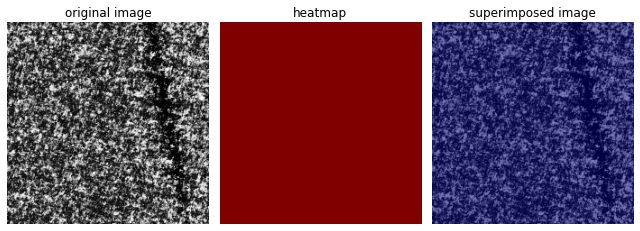

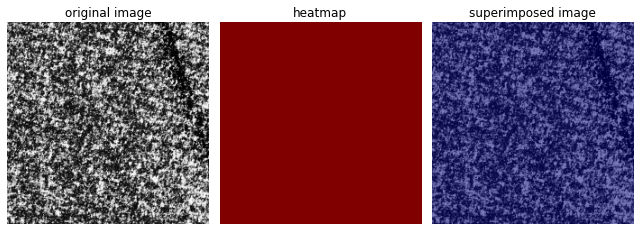

In [28]:
for root, dirs, filenames in os.walk('./Class6_resize-aug/Test/NG/'):
    for filename in filenames:
        if filename.endswith('PNG'):
            image = np.array(load_img(os.path.join(root,filename), target_size=(224, 224, 3)))
            _plot(image, classifier_model)